# Welcome:

This it the process of training the Detr Object detection model from facebook. 
Unfortunately the results were not great, hence this was not included in the explainabilty part.
For future research purposes and to show the work we put into the project this will also be made available in the repo. 

Note that there was no extensive test and validation score comparison against the predictions since the predictions looked really poorly on some single examples, plus due to the time constraints of the project we moved forward to work with YoloV8 on which we also could use a working explainability module. Hence this DETR model was a nice first try, but was not used further in the explainabilty project. Feel free to extend on it in the future.

The most important part of the whole training process is really to get the image data and annotations you have in the correct format for the Detr to be able to understand them. Comments as markdowns will be made at the most important checkpoints in the notebook for better understanding. 

The data for the training process was taken from https://github.com/ari-dasci/OD-WeaponDetection , specifically the folder "sohas weapon detection" https://github.com/ari-dasci/OD-WeaponDetection/tree/master/Weapons%20and%20similar%20handled%20objects/Sohas_weapon-Detection, since it included images and the necessary annotations.

A lot of code is taken and adapted from this repo from Niels Rogge, especially the Model and Pytorch Part: 
https://github.com/NielsRogge/Transformers-Tutorials/blob/master/DETR/Fine_tuning_DetrForObjectDetection_on_custom_dataset_(balloon).ipynb


Happy coding!


# Tutorials:

Here are some helpful resource if you every try to train your own Detr Model on costum data.

* https://colab.research.google.com/drive/1joqz4Fw3iTkPvGxOsViZiaTR8rEHMP6_#scrollTo=AVcRLJp2dl0L

* https://danielvanstrien.xyz/huggingface/huggingface-datasets/transformers/2022/08/16/detr-object-detection.html#Preparing-the-data

*   https://colab.research.google.com/github/roboflow-ai/notebooks/blob/main/notebooks/train-huggingface-detr-on-custom-dataset.ipynb?ref=blog.roboflow.com#scrollTo=jbzTzHJW22up
*   https://blog.roboflow.com/train-detr-on-custom-dataset/
*   https://github.com/NielsRogge/Transformers-Tutorials/blob/master/DETR/Fine_tuning_DetrForObjectDetection_on_custom_dataset_(balloon).ipynb
*  https://github.com/NielsRogge/Transformers-Tutorials/tree/master/DETR
*  https://danielvanstrien.xyz/huggingface/huggingface-datasets/transformers/2022/08/16/detr-object-detection.html
*  https://github.com/facebookresearch/detr







## Package Installations

In [214]:
!nvidia-smi

Tue Jun  4 13:09:49 2024       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 551.86                 Driver Version: 551.86         CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                     TCC/WDDM  | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce RTX 3060      WDDM  |   00000000:01:00.0  On |                  N/A |
|  0%   46C    P8             18W /  170W |    5313MiB /  12288MiB |     21%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [215]:
#!pip install -q transformers
#!pip install pycocotools
#!pip install -q pytorch-lightning
#!pip install timm

In [216]:
#%%capture
#!pip install datasets transformers timm wandb rich[jupyter]

## Imports

In [217]:
import os
import torch
os.environ['TORCH'] = torch.__version__
print(torch.__version__)
import torch
import torch.nn.functional as F
from tqdm.auto import tqdm
from PIL import Image

import os
import json
import numpy as np
from matplotlib.colors import LinearSegmentedColormap

import torchvision
from torchvision import models
from torchvision import transforms

2.2.2+cu118


# Data Preprocessing

## Correct Wrong Image Post Fixes
Some images were jpeg or JPG, what should all be .jpg.

In [218]:
# Directory containing your images
image_directory = "images"  # Directory containing your images
xml_directory = "annotations/xmls"  # Directory containing your XML annotations

In [219]:
import os

def rename_images(images_folder):
    """Renames images with the wrong postfix from '.jpeg' to '.jpg'."""
    for filename in os.listdir(images_folder):
        if filename.endswith('.jpeg'):
            print(filename)
            new_filename = filename.replace('.jpeg', '.jpg')
            old_path = os.path.join(images_folder, filename)
            new_path = os.path.join(images_folder, new_filename)
            os.rename(old_path, new_path)
        if filename.endswith('.JPG'):
            print(filename)
            new_filename = filename.replace('.JPG', '.jpg')
            old_path = os.path.join(images_folder, filename)
            new_path = os.path.join(images_folder, new_filename)
            os.rename(old_path, new_path)
            
rename_images(image_directory)

## Check if Images Match XMLs

In [220]:
import os

def get_missing_image_files(xml_directory, image_directory):
    xml_files = [file for file in os.listdir(xml_directory) if file.endswith(".xml") or file.endswith(".XML")]
    image_files = [file for file in os.listdir(image_directory) if file.endswith(".jpg") or file.endswith(".JPG")]
    
    missing_files = []
    
    for xml_file in xml_files:
        filename = os.path.splitext(xml_file)[0]  # Remove the file extension
        if ( filename + ".jpg" or filename + ".JPG") not in image_files:
            missing_files.append(xml_file)
            xml_path = os.path.join(xml_directory, xml_file)
            os.remove(xml_path)
    
    return missing_files

missing_files = get_missing_image_files(xml_directory, image_directory)
print(missing_files)

[]


In [221]:
len(missing_files)

0

## Import Image and Annotations

## XML to CoCo Conversion
XML was the annotation format that the data was provided with. For our context we need the usual "Coco Annotation".

A full annotation example generally looks like this: 

"annotations": [
    {
        "segmentation": [[510.66,423.01,511.72,420.03,...,510.45,423.01]],
        "area": 702.1057499999998,
        "iscrowd": 0,
        "image_id": 289343,
        "bbox": [473.07,395.93,38.65,28.67],
        "category_id": 18,
        "id": 1768
    },
    ...
    {
        "segmentation": {
            "counts": [179,27,392,41,…,55,20],
            "size": [426,640]
        },
        "area": 220834,
        "iscrowd": 1,
        "image_id": 250282,
        "bbox": [0,34,639,388],
        "category_id": 1,
        "id": 900100250282
    }
]

taken from: https://www.immersivelimit.com/tutorials/create-coco-annotations-from-scratch

In [223]:
# Directory containing your images
image_directory = "images"  # Directory containing your images
xml_directory = "annotations/xmls"  # Directory containing your XML annotations

#### Extract Categories
we have to extract the different classes as categories for the Coco data

In [224]:
import os
from xml.etree import ElementTree as ET
def extract_category_mapping(xml_directory):
  """Extracts unique object names (categories) from all XML files in a directory and maps them to consecutive integers.

  Args:
      xml_directory: Path to the directory containing the XML annotation files.

  Returns:
      A dictionary mapping unique object names (categories) to consecutive integers starting from 1.
  """
  category_mapping = {}
  category_id = 1
  for filename in tqdm(os.listdir(xml_directory)):
    if filename.endswith(".xml"):
      xml_path = os.path.join(xml_directory, filename)
      tree = ET.parse(xml_path)
      root = tree.getroot()

      for obj in root.findall('object'):
        category_name = obj.find('name').text
        if category_name not in category_mapping:
          category_mapping[category_name] = category_id
          category_id += 1

  return category_mapping


In [225]:
category_mapping = extract_category_mapping(xml_directory)

print(f"Category mapping: {category_mapping}")

100%|██████████| 5002/5002 [00:16<00:00, 298.39it/s]

Category mapping: {'knife': 1, 'billete': 2, 'monedero': 3, 'pistol': 4, 'smartphone': 5, 'tarjeta': 6}


#### Convert to COCO
This function converts the XML annotations to the Coco annotations that we need

In [226]:
import os
from xml.etree import ElementTree as ET
from collections import Counter


def convert_to_coco(xml_directory, category_mapping, output_filename="coco_annotations.json"):
  """Converts XML annotation files in a directory to COCO format and saves it to a JSON file.

  Args:
      xml_directory: Path to the directory containing the XML annotation files.
      category_mapping: Dictionary mapping unique object names (categories) to their corresponding COCO category IDs.
      output_filename: Filename for the output COCO annotations JSON file (default: "coco_annotations.json").
  """
  coco_annotations = {"images": [], "annotations": []}
  image_id = 1  # Counter for image IDs

  xml_files = sorted(os.listdir(xml_directory))

  for filename in tqdm(xml_files):
    if filename.endswith(".xml"):
      xml_path = os.path.join(xml_directory, filename)
      image_filename = os.path.splitext(filename)[0] + ".jpg"  # Extract filename without extension

      # Print debug information
      #print(f"Processing image: {filename}")
      #print(f"Expected image filename: {image_filename}")

      tree = ET.parse(xml_path)
      root = tree.getroot()

      annotations = []
      #annotations = {}
      for obj in root.findall('object'):
        name = obj.find('name').text
        category_id = category_mapping.get(name)
        if category_id is None:
          print(f"Warning: Category '{name}' not found in mapping. Skipping object.")
          continue
            
        
        xmin = int(obj.find('bndbox/xmin').text)
        ymin = int(obj.find('bndbox/ymin').text)
        xmax = int(obj.find('bndbox/xmax').text)
        ymax = int(obj.find('bndbox/ymax').text)
        width = xmax - xmin
        height = ymax - ymin
        area = width * height

        annotation = {
            "image_id": image_id,
            "file_name": image_filename,
            "id": len(coco_annotations["annotations"]) + 1,  # Unique ID for each annotation (incrementing counter)
            "category_id": category_id,
            "name": name,
            "bbox": [xmin, ymin, width, height],
            "area": area,
            "iscrowd" : False
        }
        annotations = annotation
        #annotations.append(annotation)
      #print(annotations)
      #print(image_id, image_filename)
      # Add image information
      coco_annotations["images"].append({
            "id": image_id,
            "file_name": image_filename
      })

      # Add annotations for this image
      # Modify annotations in-place # remove the outer list brackets (workaround until I can run the actual XML to COCO conversion again)
      #coco_annotations["annotations"] = {annotation["id"]: annotation for annotation in coco_annotations["annotations"]}
      coco_annotations["annotations"].append(annotations)
      #coco_annotations["annotations"] = annotations
      #print(coco_annotations)
      image_id += 1

  # Save COCO annotations to JSON file
  with open("annotations/coco_xmls/coco_annotations.json", "w") as f:
    json.dump(coco_annotations, f)
  print("Successfully written annotation json file")
  return coco_annotations


In [227]:
# Example usage (assuming you have the category_mapping dictionary)
coco_annotations = convert_to_coco(xml_directory, category_mapping)


100%|██████████| 5002/5002 [00:00<00:00, 12465.60it/s]

Successfully written annotation json file


In [228]:
with open("annotations/coco_xmls/coco_annotations.json", "rb") as f:
    coco_annotations = json.load(f)

In [229]:

xml_files = sorted(os.listdir(xml_directory))
len(xml_files)

5002

In [230]:
len(coco_annotations["images"]), len(coco_annotations["annotations"])

(5002, 5002)

In [231]:
coco_annotations["images"][2037], coco_annotations["annotations"][2037]

({'id': 2038, 'file_name': 'knife_76.jpg'},
 {'image_id': 2038,
  'file_name': 'knife_76.jpg',
  'id': 2038,
  'category_id': 1,
  'name': 'knife',
  'bbox': [8, 13, 295, 239],
  'area': 70505,
  'iscrowd': False})

In [232]:
coco_annotations["images"][500], coco_annotations["annotations"][500]

({'id': 501, 'file_name': 'KravMagaTraining21141.jpg'},
 {'image_id': 501,
  'file_name': 'KravMagaTraining21141.jpg',
  'id': 501,
  'category_id': 1,
  'name': 'knife',
  'bbox': [749, 333, 170, 133],
  'area': 22610,
  'iscrowd': False})

### Visualize BBox Example
This function can display an image with its corresponding annotation box, that is used by the model in training to correctly identify the objects.

In [233]:
import matplotlib.pyplot as plt
from PIL import Image

def visualize_coco_example(coco_annotations, image_index, image_directory):
  """Visualizes an image with its corresponding bounding box from COCO annotations.

  Args:
      coco_annotations: A dictionary containing COCO annotations.
      image_index: The index of the image and annotation to visualize (0-based indexing).
      image_directory: Path to the directory containing the images.
  """
  image_info = coco_annotations["images"][image_index]
  annotation = coco_annotations["annotations"][image_index]#[0]

  image_filename = image_info["file_name"]
  image_path = os.path.join(image_directory, image_filename)# + ".jpg"  # Assuming ".jpg" extension

  try:
    image = Image.open(image_path)
    if image.mode != 'RGB':
      image = image.convert('RGB')  # Convert to RGB if needed

    bbox = annotation["bbox"]
    xmin, ymin, width, height = bbox
    xmax = xmin + width
    ymax = ymin + height

    plt.figure(figsize=(10, 6))  # Adjust figure size as needed

    # Display the image
    plt.imshow(image)

    # Draw the bounding box
    plt.plot([xmin, xmax, xmax, xmin, xmin], [ymin, ymin, ymax, ymax, ymin], color='red', linewidth=2)

    # Label the object name (optional)
    plt.text(xmin, ymin - 10, annotation["name"], color='red', fontsize=12, bbox=dict(facecolor='white', alpha=0.7))

    plt.axis('off')  # Hide axes
    plt.title(f"Image: {image_filename}")
    plt.show()

  except FileNotFoundError:
    print(f"Error: Image file '{image_filename}' not found.")



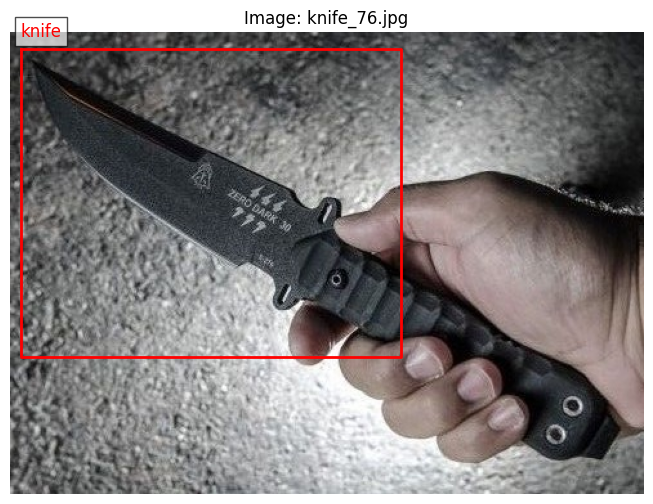

In [234]:
# Example usage
image_directory = "images"
coco_annotations = coco_annotations
visualize_coco_example(coco_annotations, 2037, image_directory)

# Create PyTorch dataset + dataloaders

The standard way in PyTorch to train a model is by creating datasets and a corresponding dataloaders. See [this guide](https://pytorch.org/tutorials/beginner/basics/data_tutorial.html) if you're not familiar with them.

Here we define a regular PyTorch dataset. Each item of the dataset is an image and corresponding annotations. Torchvision already provides a `CocoDetection` dataset, which we can use. We only add an image processor (`DetrImageProcessor`) to resize + normalize the images, and to turn the annotations (which are in COCO format) in the format that DETR expects. It will also resize the annotations accordingly.

## Train Val Split

In [236]:
print(f"Category mapping: {category_mapping}")

Category mapping: {'knife': 1, 'billete': 2, 'monedero': 3, 'pistol': 4, 'smartphone': 5, 'tarjeta': 6}


In [237]:
categories = [{"id" : 1 ,"name" : "knife"},
                    {"id" : 2 ,"name" : "billete"},
                    {"id" : 3 ,"name": "monedero"},
                    {"id" : 4 ,"name" : "pistol"},
                    {"id" : 5 ,"name" : "smartphone"},
                    {"id" : 6 ,"name" : "tarjeta"}]

In [238]:
# Load the COCO format JSON data
with open("annotations/coco_xmls/coco_annotations.json", "rb") as f:
    coco_annotations = json.load(f)

In [239]:
coco_annotations["annotations"][0], coco_annotations["images"][0]

({'image_id': 1,
  'file_name': 'ABbframe00154.jpg',
  'id': 1,
  'category_id': 1,
  'name': 'knife',
  'bbox': [899, 452, 111, 116],
  'area': 12876,
  'iscrowd': False},
 {'id': 1, 'file_name': 'ABbframe00154.jpg'})

In [240]:
coco_annotations["annotations"][2037], coco_annotations["images"][2037]

({'image_id': 2038,
  'file_name': 'knife_76.jpg',
  'id': 2038,
  'category_id': 1,
  'name': 'knife',
  'bbox': [8, 13, 295, 239],
  'area': 70505,
  'iscrowd': False},
 {'id': 2038, 'file_name': 'knife_76.jpg'})

In [241]:
coco_annotations["annotations"][2037], coco_annotations["images"][2037]

({'image_id': 2038,
  'file_name': 'knife_76.jpg',
  'id': 2038,
  'category_id': 1,
  'name': 'knife',
  'bbox': [8, 13, 295, 239],
  'area': 70505,
  'iscrowd': False},
 {'id': 2038, 'file_name': 'knife_76.jpg'})

In [242]:
coco_annotations["annotations"][0], coco_annotations["images"][0]

({'image_id': 1,
  'file_name': 'ABbframe00154.jpg',
  'id': 1,
  'category_id': 1,
  'name': 'knife',
  'bbox': [899, 452, 111, 116],
  'area': 12876,
  'iscrowd': False},
 {'id': 1, 'file_name': 'ABbframe00154.jpg'})

In [243]:
import json
from random import shuffle

# Define your split ratio (e.g., 80% training, 20% validation)
train_ratio = 0.9

## Load the COCO format JSON data
#with open("/content/drive/MyDrive/DSAI2_xAI/data/Sohas_weapon-Detection/annotations/coco_xmls/coco_annotations.json", "rb") as f:
#    coco_annotations = json.load(f)

# Get the list of images (filenames) and annotations
images = coco_annotations["images"]
annotations = coco_annotations["annotations"]

# Shuffle the data for randomness
#shuffle(images)
#shuffle(annotations)

# Calculate split points based on the ratio
train_split = int(len(images) * train_ratio)

# Separate training and validation data based on filenames
train_images = images[:train_split]
val_images = images[train_split:]

# Filter annotations based on image presence in training/validation sets
train_annotations = annotations[:train_split]
val_annotations = annotations[train_split:]

# Create separate dictionaries for training and validation data
train_data = {"images": train_images, "annotations": train_annotations, "categories": categories}
val_data = {"images": val_images, "annotations": val_annotations, "categories": categories}

# Save the split data to separate JSON files (optional)
with open("annotations/coco_xmls/train_data.json", "w") as f:
    json.dump(train_data, f)

with open("annotations/coco_xmls/val_data.json", "w") as f:
    json.dump(val_data, f)

In [244]:
len(train_data["images"]), len(val_data["images"]), len(train_data["images"]) + len(val_data["images"])

(4501, 501, 5002)

In [245]:
train_data["images"][2345], train_data["annotations"][2345] , train_data["categories"]

({'id': 2346, 'file_name': 'monedero_1219.jpg'},
 {'image_id': 2346,
  'file_name': 'monedero_1219.jpg',
  'id': 2346,
  'category_id': 3,
  'name': 'monedero',
  'bbox': [304, 459, 118, 121],
  'area': 14278,
  'iscrowd': False},
 [{'id': 1, 'name': 'knife'},
  {'id': 2, 'name': 'billete'},
  {'id': 3, 'name': 'monedero'},
  {'id': 4, 'name': 'pistol'},
  {'id': 5, 'name': 'smartphone'},
  {'id': 6, 'name': 'tarjeta'}])

In [246]:
val_data["images"][142], val_data["annotations"][142]

({'id': 4644, 'file_name': 'smartphone_0548.jpg'},
 {'image_id': 4644,
  'file_name': 'smartphone_0548.jpg',
  'id': 4644,
  'category_id': 5,
  'name': 'smartphone',
  'bbox': [755, 709, 326, 571],
  'area': 186146,
  'iscrowd': False})

## Pytorch Dataset Creation
We create the pytorch dataset needed to perform the training

In [247]:
import torchvision
import os

class CocoDetection(torchvision.datasets.CocoDetection):
    def __init__(self, img_folder, annotation_folder, processor, train=True):
        ann_file = os.path.join(annotation_folder, "train_data.json" if train else "val_data.json")
        super(CocoDetection, self).__init__(img_folder, ann_file)
        self.processor = processor

    def __getitem__(self, idx):
        # read in PIL image and target in COCO format
        # feel free to add data augmentation here before passing them to the next step
        img, target = super(CocoDetection, self).__getitem__(idx)

        # preprocess image and target (converting target to DETR format, resizing + normalization of both image and target)
        image_id = self.ids[idx]
        target = {'image_id': image_id, 'annotations': target}
        encoding = self.processor(images=img, annotations=target, return_tensors="pt")
        pixel_values = encoding["pixel_values"].squeeze() # remove batch dimension
        target = encoding["labels"][0] # remove batch dimension

        return pixel_values, target

In [249]:
from transformers import DetrImageProcessor

image_directory = "images/"
annotation_directory = "annotations/coco_xmls/"

processor = DetrImageProcessor.from_pretrained("facebook/detr-resnet-50")

train_dataset = CocoDetection(image_directory, annotation_directory, processor=processor)
val_dataset = CocoDetection(image_directory, annotation_directory, processor=processor, train=False)

loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


In [250]:
print("Number of training examples:", len(train_dataset))
print("Number of validation examples:", len(val_dataset))
print("Total Length:", len(train_dataset) + len(val_dataset))

Number of training examples: 4501
Number of validation examples: 501
Total Length: 5002


In [251]:
train_dataset[0]

(tensor([[[-1.6898, -1.6898, -1.6898,  ...,  0.0227,  0.0227,  0.0227],
          [-1.6898, -1.6898, -1.6898,  ...,  0.0227,  0.0398,  0.0398],
          [-1.6898, -1.6898, -1.6898,  ...,  0.0398,  0.0398,  0.0398],
          ...,
          [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
          [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
          [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179]],
 
         [[-1.5805, -1.5805, -1.5805,  ...,  0.2052,  0.2052,  0.2052],
          [-1.5805, -1.5805, -1.5805,  ...,  0.2052,  0.2227,  0.2227],
          [-1.5805, -1.5805, -1.5805,  ...,  0.2227,  0.2227,  0.2227],
          ...,
          [ 0.3277,  0.3277,  0.3277,  ...,  0.3277,  0.3277,  0.3277],
          [ 0.3277,  0.3452,  0.3452,  ...,  0.3277,  0.3277,  0.3277],
          [ 0.3277,  0.3277,  0.3277,  ...,  0.3277,  0.3277,  0.3277]],
 
         [[-1.3164, -1.3164, -1.3164,  ...,  0.5834,  0.5834,  0.5834],
          [-1.3164, -1.3164,

## Visualize Examples
Again we are visualizing examples from the pytorch dataset to check if everything is set up correctly for the model to train

In [252]:
train_dataset.coco.cats

{1: {'id': 1, 'name': 'knife'},
 2: {'id': 2, 'name': 'billete'},
 3: {'id': 3, 'name': 'monedero'},
 4: {'id': 4, 'name': 'pistol'},
 5: {'id': 5, 'name': 'smartphone'},
 6: {'id': 6, 'name': 'tarjeta'}}

In [304]:
import numpy as np
import os
from PIL import Image, ImageDraw,ImageFont

def viz_coco_data(train_dataset):
  # based on https://github.com/woctezuma/finetune-detr/blob/master/finetune_detr.ipynb
  image_ids = train_dataset.coco.getImgIds()
  # let's pick a random image
  image_id = image_ids[np.random.randint(0, len(image_ids))]
  print('Image n°{}'.format(image_id))
  image = train_dataset.coco.loadImgs(image_id)[0]
  image = Image.open(os.path.join('images/', image['file_name']))
  print(image)
  annotations = train_dataset.coco.imgToAnns[image_id]
  draw = ImageDraw.Draw(image, "RGBA")

  cats = train_dataset.coco.cats

  id2label = {k: v['name'] for k,v in cats.items()}
  ### category = category_mapping

  for annotation in annotations:
    box = annotation['bbox']
    class_name = annotation['name']
    class_idx = annotation['category_id']
    x,y,w,h = tuple(box)
    draw.rectangle((x,y,x+w,y+h), outline='red', width=1)

    draw.text((x, y), id2label[class_idx], fill='yellow', size=15, bbox=dict(facecolor='yellow', alpha=0.5))
    
  print(id2label[class_idx])
  display(image)


Image n°4776
<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1920x1281 at 0x2786274A2D0>
smartphone


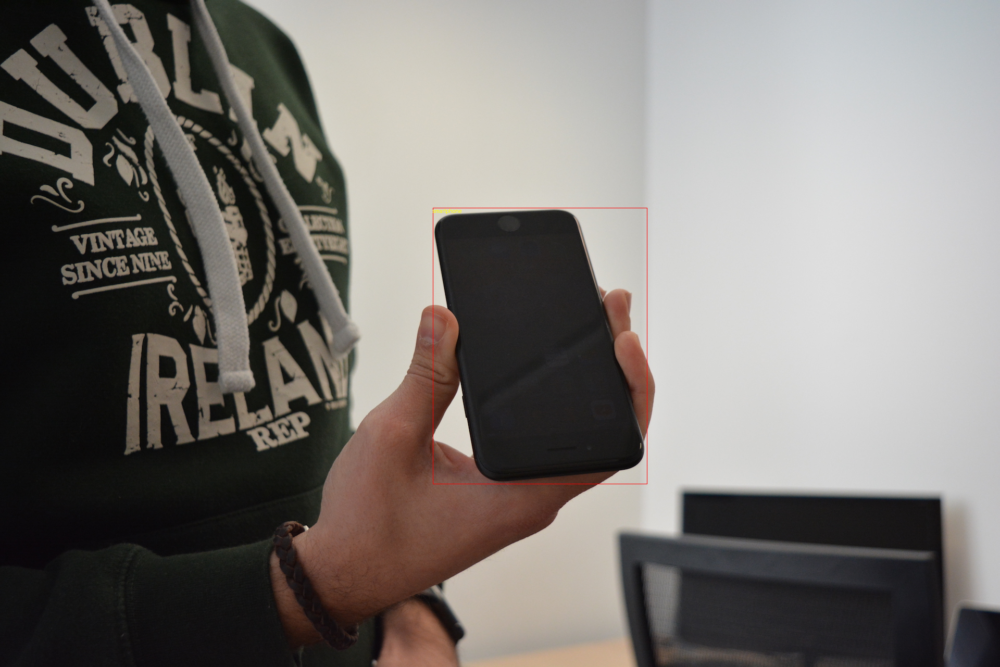

In [309]:
viz_coco_data(val_dataset)

## Batch Loader

In [346]:
from torch.utils.data import DataLoader

def collate_fn(batch):
  pixel_values = [item[0] for item in batch]
  encoding = processor.pad(pixel_values, return_tensors="pt")
  labels = [item[1] for item in batch]
  batch = {}
  batch['pixel_values'] = encoding['pixel_values']
  batch['pixel_mask'] = encoding['pixel_mask']
  batch['labels'] = labels
  return batch

train_dataloader = DataLoader(train_dataset, collate_fn=collate_fn, batch_size=4, shuffle=False) #shuffle=True
val_dataloader = DataLoader(val_dataset, collate_fn=collate_fn, batch_size=1)
batch = next(iter(train_dataloader))

https://pytorch.org/docs/stable/data.html#torch.utils.data.DataLoader
play with dataloader settings if it doesnt work

In [347]:
batch.keys()

dict_keys(['pixel_values', 'pixel_mask', 'labels'])

In [348]:
pixel_values, target = train_dataset[5]

In [349]:
pixel_values.shape

torch.Size([3, 757, 1333])

In [350]:
print(target)

{'size': tensor([ 757, 1333]), 'image_id': tensor([6]), 'class_labels': tensor([1]), 'boxes': tensor([[0.6857, 0.4899, 0.0536, 0.1266]]), 'area': tensor([6853.5347]), 'iscrowd': tensor([0]), 'orig_size': tensor([1090, 1920])}


In [351]:
train_data["images"][5], train_data["annotations"][5] 

({'id': 6, 'file_name': 'ABbframe00235.jpg'},
 {'image_id': 6,
  'file_name': 'ABbframe00235.jpg',
  'id': 6,
  'category_id': 1,
  'name': 'knife',
  'bbox': [1265, 465, 103, 138],
  'area': 14214,
  'iscrowd': False})

# Train the model using PyTorch Lightning

Here we define a `LightningModule`, which is an `nn.Module` with some extra functionality.

For more information regarding PyTorch Lightning, I recommend the [docs](https://pytorch-lightning.readthedocs.io/en/latest/?_ga=2.35105442.2002381006.1623231889-1738348008.1615553774) as well as the [tutorial notebooks](https://github.com/PyTorchLightning/lightning-tutorials/tree/aeae8085b48339e9bd9ab61d81cc0dc8b0d48f9c/.notebooks/starters).

You can of course just train the model in native PyTorch as an alternative.

In [352]:
#!pip install -q pytorch-lightning

## Model Setup

In [353]:
import pytorch_lightning as pl
from transformers import DetrForObjectDetection
import torch

class Detr(pl.LightningModule):
     def __init__(self, lr, lr_backbone, weight_decay):
         super().__init__()
         # replace COCO classification head with custom head
         # we specify the "no_timm" variant here to not rely on the timm library
         # for the convolutional backbone
         self.model = DetrForObjectDetection.from_pretrained("facebook/detr-resnet-50",
                                                             revision="no_timm",
                                                             num_labels=len(id2label),
                                                             ignore_mismatched_sizes=True)
         # see https://github.com/PyTorchLightning/pytorch-lightning/pull/1896
         self.lr = lr
         self.lr_backbone = lr_backbone
         self.weight_decay = weight_decay

     def forward(self, pixel_values, pixel_mask):
       outputs = self.model(pixel_values=pixel_values, pixel_mask=pixel_mask)

       return outputs

     def common_step(self, batch, batch_idx):
       pixel_values = batch["pixel_values"]
       pixel_mask = batch["pixel_mask"]
       labels = [{k: v.to(self.device) for k, v in t.items()} for t in batch["labels"]]

       outputs = self.model(pixel_values=pixel_values, pixel_mask=pixel_mask, labels=labels)

       loss = outputs.loss
       loss_dict = outputs.loss_dict

       return loss, loss_dict

     def training_step(self, batch, batch_idx):
        loss, loss_dict = self.common_step(batch, batch_idx)
        # logs metrics for each training_step,
        # and the average across the epoch
        self.log("training_loss", loss)
        for k,v in loss_dict.items():
          self.log("train_" + k, v.item())

        return loss

     def validation_step(self, batch, batch_idx):
        loss, loss_dict = self.common_step(batch, batch_idx)
        self.log("validation_loss", loss)
        for k,v in loss_dict.items():
          self.log("validation_" + k, v.item())

        return loss

     def configure_optimizers(self):
        param_dicts = [
              {"params": [p for n, p in self.named_parameters() if "backbone" not in n and p.requires_grad]},
              {
                  "params": [p for n, p in self.named_parameters() if "backbone" in n and p.requires_grad],
                  "lr": self.lr_backbone,
              },
        ]
        optimizer = torch.optim.AdamW(param_dicts, lr=self.lr,
                                  weight_decay=self.weight_decay)

        return optimizer

     def train_dataloader(self):
        return train_dataloader

     def val_dataloader(self):
        return val_dataloader

## Tensorboard
Check Training in Real Time


In [354]:
# Start tensorboard.
%load_ext tensorboard
%tensorboard --logdir lightning_logs/

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 18260), started 1 day, 2:15:18 ago. (Use '!kill 18260' to kill it.)

In [355]:
model = Detr(lr=1e-4, lr_backbone=1e-5, weight_decay=1e-4)

outputs = model(pixel_values=batch['pixel_values'], pixel_mask=batch['pixel_mask'])

Some weights of DetrForObjectDetection were not initialized from the model checkpoint at facebook/detr-resnet-50 and are newly initialized because the shapes did not match:
- class_labels_classifier.weight: found shape torch.Size([92, 256]) in the checkpoint and torch.Size([7, 256]) in the model instantiated
- class_labels_classifier.bias: found shape torch.Size([92]) in the checkpoint and torch.Size([7]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [343]:
outputs.logits.shape

torch.Size([64, 100, 7])

## Train Model

In [344]:
torch.set_float32_matmul_precision('high')

In [ ]:
from pytorch_lightning import Trainer
from pytorch_lightning.loggers import TensorBoardLogger

#logger = TensorBoardLogger("tensorboard_logs")

trainer = Trainer(max_epochs = 1 , gradient_clip_val=0.1)# max_steps=300, logger=logger)
trainer.fit(model)

In [318]:
from pytorch_lightning import Trainer
from pytorch_lightning.loggers import TensorBoardLogger

#logger = TensorBoardLogger("tensorboard_logs")

trainer = Trainer(max_epochs = 5 , gradient_clip_val=0.1)# max_steps=300, logger=logger)
trainer.fit(model)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
You are using a CUDA device ('NVIDIA GeForce RTX 3060') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type                   | Params
-------------------------------------------------
0 | model | DetrForObjectDetection | 41.5 M
-------------------------------------------------
18.0 M    Trainable params
23.5 M    Non-trainable params
41.5 M    Total params
166.012   Total estimated model params size (MB)


Sanity Checking DataLoader 0:   0%|          | 0/2 [00:00<?, ?it/s]

c:\Users\Timo\.pyenv\pyenv-win\versions\3.12.2\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=23` in the `DataLoader` to improve performance.


c:\Users\Timo\.pyenv\pyenv-win\versions\3.12.2\Lib\site-packages\pytorch_lightning\utilities\data.py:77: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 1. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.
c:\Users\Timo\.pyenv\pyenv-win\versions\3.12.2\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=23` in the `DataLoader` to improve performance.


Epoch 4: 100%|██████████| 1126/1126 [12:10<00:00,  1.54it/s, v_num=7]

`Trainer.fit` stopped: `max_epochs=5` reached.


Epoch 4: 100%|██████████| 1126/1126 [12:11<00:00,  1.54it/s, v_num=7]


## Save Model

In [356]:
model_path = "model/model_5k_epochs"
torch.save(model.state_dict(), model_path)

# Model Evaluation

## Load Model

In [ ]:
model_path = "model/model_5k_epochs"
model.load_state_dict(torch.load(model_path))


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

Detr(
  (model): DetrForObjectDetection(
    (model): DetrModel(
      (backbone): DetrConvModel(
        (conv_encoder): DetrConvEncoder(
          (model): ResNetBackbone(
            (embedder): ResNetEmbeddings(
              (embedder): ResNetConvLayer(
                (convolution): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
                (normalization): DetrFrozenBatchNorm2d()
                (activation): ReLU()
              )
              (pooler): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
            )
            (encoder): ResNetEncoder(
              (stages): ModuleList(
                (0): ResNetStage(
                  (layers): Sequential(
                    (0): ResNetBottleNeckLayer(
                      (shortcut): ResNetShortCut(
                        (convolution): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
                        (normalization): DetrFrozenBatchNorm2d

In [ ]:
%pip install -q coco-eval

Note: you may need to restart the kernel to use updated packages.


## Convert Coco to Eval
Here we do processing to evaluate the predictions

In [2]:
def convert_to_xywh(boxes):
    xmin, ymin, xmax, ymax = boxes.unbind(1)
    return torch.stack((xmin, ymin, xmax - xmin, ymax - ymin), dim=1)

def prepare_for_coco_detection(predictions):
    coco_results = []
    for original_id, prediction in predictions.items():
        if len(prediction) == 0:
            continue

        boxes = prediction["boxes"]
        boxes = convert_to_xywh(boxes).tolist()
        scores = prediction["scores"].tolist()
        labels = prediction["labels"].tolist()

        coco_results.extend(
            [
                {
                    "image_id": original_id,
                    "category_id": labels[k],
                    "bbox": box,
                    "score": scores[k],
                }
                for k, box in enumerate(boxes)
            ]
        )
    return coco_results

In [ ]:
len(val_dataset) # batch size is 2, thats why only half get processed below

In [ ]:
from coco_eval import CocoEvaluator
from tqdm.notebook import tqdm
from tqdm.auto import tqdm
import numpy as np

# initialize evaluator with ground truth (gt)
evaluator = CocoEvaluator(coco_gt=val_dataset.coco, iou_types=["bbox"])

visualized_results = {} 

#print("Running evaluation...")
for idx, batch in enumerate(tqdm(val_dataloader)):
    # get the inputs
    pixel_values = batch["pixel_values"].to(device) # images
    pixel_mask = batch["pixel_mask"].to(device)  # binary masks
    labels = [{k: v.to(device) for k, v in t.items()} for t in batch["labels"]] # these are in DETR format, resized + normalized
    #print("Labels:", labels)
    # forward pass
    with torch.no_grad():
      outputs = model(pixel_values=pixel_values, pixel_mask=pixel_mask)
      #print("Outputs:" ,outputs)
    # turn into a list of dictionaries (one item for each example in the batch)
    orig_target_sizes = torch.stack([target["orig_size"] for target in labels], dim=0)
    results = processor.post_process_object_detection(outputs, target_sizes=orig_target_sizes, threshold=0)
    
    # visualize results
    # load image based on ID
    #print(batch)
    ids = {target['image_id'].item(): output for target, output in zip(labels, results)}
    image_id = list(ids.keys())[0]
    #print(image_id)
    image = val_dataset.coco.loadImgs(image_id)[0]
    #print(image)
    image = Image.open(os.path.join('images', image['file_name']))

    # postprocess model outputs
    width, height = image.size
    #print("Image Size:", width, height)
    visualize_results = processor.post_process_object_detection(outputs, target_sizes=[(height, width)], threshold=0.9)
    visualized_results[image_id] = results # save for later
    #print(visualize_results)

    # prepare for evaluation
    #print("orig_target_sizes: " , orig_target_sizes)
    #print("results: ", results)
    #print("results.keys: ", results[0].keys())
    # provide to metric
    # metric expects a list of dictionaries, each item
    # containing image_id, category_id, bbox and score keys
    predictions = {target['image_id'].item(): output for target, output in zip(labels, results)}
    #print("Prediction: ", predictions)
    predictions = prepare_for_coco_detection(predictions)
    evaluator.update(predictions)
    
    

evaluator.synchronize_between_processes()
evaluator.accumulate()
evaluator.summarize()

In [113]:
predictions

[{'image_id': 4502,
  'category_id': 1,
  'bbox': [162.1285400390625,
   617.3961181640625,
   664.6287231445312,
   178.145751953125],
  'score': 7.468010153388605e-05,
  'segmentation': [[162.1285400390625,
    617.3961181640625,
    162.1285400390625,
    795.5418701171875,
    826.7572631835938,
    795.5418701171875,
    826.7572631835938,
    617.3961181640625]],
  'area': 118400.78365422785,
  'id': 1,
  'iscrowd': 0},
 {'image_id': 4502,
  'category_id': 1,
  'bbox': [687.2243041992188,
   239.2655029296875,
   150.9368896484375,
   150.76019287109375],
  'score': 0.00011400409857742488,
  'segmentation': [[687.2243041992188,
    239.2655029296875,
    687.2243041992188,
    390.02569580078125,
    838.1611938476562,
    390.02569580078125,
    838.1611938476562,
    239.2655029296875]],
  'area': 22755.27459476143,
  'id': 2,
  'iscrowd': 0},
 {'image_id': 4502,
  'category_id': 1,
  'bbox': [253.45004272460938,
   671.6082153320312,
   92.97286987304688,
   117.5908203125],
 

# Inference (+ visualization)

Let's visualize the predictions of DETR on the first image of the validation set.

In [360]:
import matplotlib.pyplot as plt

# colors for visualization
COLORS = [[0.000, 0.447, 0.741], [0.850, 0.325, 0.098], [0.929, 0.694, 0.125],
          [0.494, 0.184, 0.556], [0.466, 0.674, 0.188], [0.301, 0.745, 0.933]]

def plot_results(pil_img, scores, labels, boxes):
    plt.figure(figsize=(16,10))
    plt.imshow(pil_img)
    ax = plt.gca()
    colors = COLORS * 100
    for score, label, (xmin, ymin, xmax, ymax),c  in zip(scores.tolist(), labels.tolist(), boxes.tolist(), colors):
        ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                   fill=False, color=c, linewidth=3))
        text = f'{id2label[label]}: {score:0.2f}'
        ax.text(xmin, ymin, text, fontsize=15,
                bbox=dict(facecolor='yellow', alpha=0.5))
    plt.axis('off')
    plt.show()

In [393]:
import random

def plot_pred_eval():

  # random image from validation set
  random_id = random.randint(0, len(val_dataset) - 1)

  #We can use the image_id in target to know which image it is
  pixel_values, target = val_dataset[random_id]
  
  pixel_values = pixel_values.unsqueeze(0).to(device)
  print(pixel_values.shape)

  # make predictions for image
  with torch.no_grad():
    # forward pass to get class logits and bounding boxes
    outputs = model(pixel_values=pixel_values, pixel_mask=None)
    print("Outputs:", outputs.keys())

  # load image based on ID
  #image_id = target['image_id'].item()
  image_id = target['image_id'].item()
  image = val_dataset.coco.loadImgs(image_id)[0]
  image = Image.open(os.path.join('images', image['file_name']))

  # postprocess model outputs
  width, height = image.size
  postprocessed_outputs = processor.post_process_object_detection(outputs,
                                                                  target_sizes=[(height, width)],
                                                                  threshold=0.25)
  #print(postprocessed_outputs)
  results = postprocessed_outputs[0]
  #print(postprocessed_outputs)
  plot_results(image, results['scores'], results['labels'], results['boxes'])

torch.Size([1, 3, 800, 1217])
Outputs: odict_keys(['logits', 'pred_boxes', 'last_hidden_state', 'encoder_last_hidden_state'])


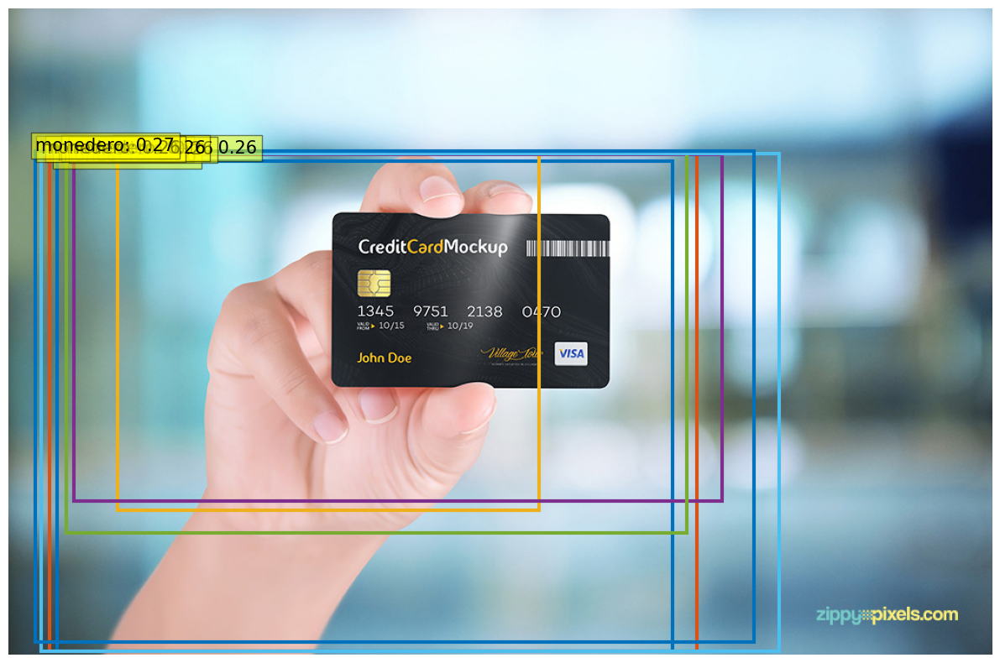

In [407]:
plot_pred_eval()

As we can see the predictions confidence is rather low, plus the the predictions are all over the place, not really correctly identifying the box around the object either. 

## Alternative plot code

In [187]:
#We can use the image_id in target to know which image it is
pixel_values, target = val_dataset[50]

In [188]:
pixel_values = pixel_values.unsqueeze(0).to(device)
print(pixel_values.shape)

torch.Size([1, 3, 800, 1200])


In [189]:
with torch.no_grad():
  # forward pass to get class logits and bounding boxes
  outputs = model(pixel_values=pixel_values, pixel_mask=None)
print("Outputs:", outputs.keys())

Outputs: odict_keys(['logits', 'pred_boxes', 'last_hidden_state', 'encoder_last_hidden_state'])


In [190]:
import matplotlib.pyplot as plt

# colors for visualization
COLORS = [[0.000, 0.447, 0.741], [0.850, 0.325, 0.098], [0.929, 0.694, 0.125],
          [0.494, 0.184, 0.556], [0.466, 0.674, 0.188], [0.301, 0.745, 0.933]]

def plot_results(pil_img, scores, labels, boxes):
    plt.figure(figsize=(16,10))
    plt.imshow(pil_img)
    ax = plt.gca()
    colors = COLORS * 100
    for score, label, (xmin, ymin, xmax, ymax),c  in zip(scores.tolist(), labels.tolist(), boxes.tolist(), colors):
        ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                   fill=False, color=c, linewidth=3))
        text = f'{id2label[label]}: {score:0.2f}'
        ax.text(xmin, ymin, text, fontsize=15,
                bbox=dict(facecolor='yellow', alpha=0.5))
    plt.axis('off')
    plt.show()

In [191]:
val_data["images"][0]

{'id': 4502, 'file_name': 'smartphone_0342.jpg'}

In [192]:
val_dataset.coco.loadImgs(image_id)[0]

{'id': 4552, 'file_name': 'smartphone_0402.jpg'}

[{'scores': tensor([0.3737], device='cuda:0'), 'labels': tensor([5], device='cuda:0'), 'boxes': tensor([[ 90.2531,  37.4550, 844.8696, 661.4506]], device='cuda:0')}]
[{'scores': tensor([0.3737], device='cuda:0'), 'labels': tensor([5], device='cuda:0'), 'boxes': tensor([[ 90.2531,  37.4550, 844.8696, 661.4506]], device='cuda:0')}]


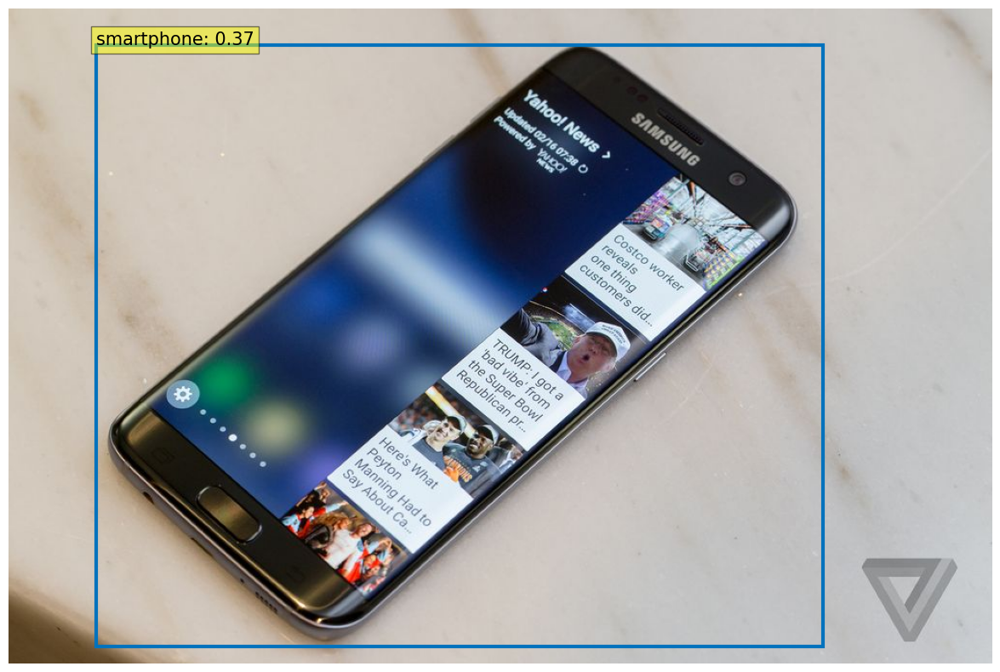

In [193]:
# load image based on ID
#image_id = target['image_id'].item()
image_id = target['image_id'].item()
image = val_dataset.coco.loadImgs(image_id)[0]
image = Image.open(os.path.join('images', image['file_name']))

# postprocess model outputs
width, height = image.size
postprocessed_outputs = processor.post_process_object_detection(outputs,
                                                                target_sizes=[(height, width)],
                                                                threshold=0.3)
print(postprocessed_outputs)
results = postprocessed_outputs[0]
print(postprocessed_outputs)
plot_results(image, results['scores'], results['labels'], results['boxes'])

Some cases work better than others. Here e.g. the smartphones is correctly identified, but with a really low confidence of ~40 %. 